<a href="https://colab.research.google.com/github/PrinceIoT/OpenCV-Tasks/blob/main/Project_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import os
print(os.listdir())

['.config', 'face.jpeg', 'haarcascade_eye.xml', 'sample_data']


In [ ]:
!pip install opencv-python

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
from random import randint

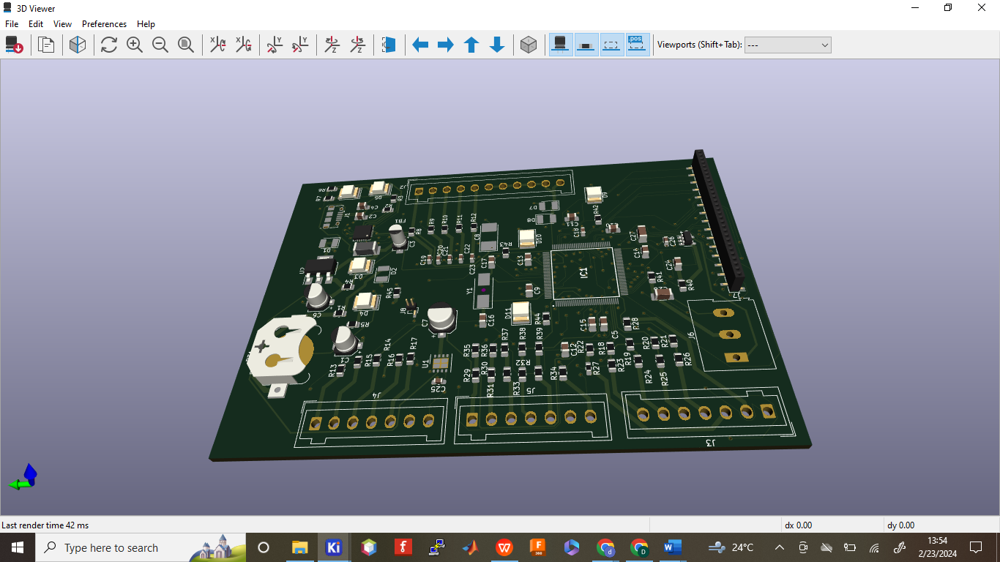

In [ ]:
img = cv2.imread('pcb.png')
cv2_imshow(img)

In [ ]:
cv2.imwrite("pcb_output.png", img)

True

In [ ]:
os.stat("pcb.png").st_size

268189

In [ ]:
os.stat("pcb_output.png").st_size

334333

In [ ]:
len(img)

768

In [ ]:
img.shape

(768, 1366, 3)

In [ ]:
img.dtype

dtype('uint8')

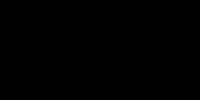

[0]


In [ ]:
black = np.zeros([100,200,1],'uint8')
cv2_imshow(black)
print(black[0,0,:])

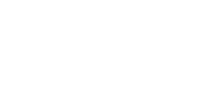

[255 255 255]


In [ ]:
white = np.ones([100,200,3], 'uint8')
white = white*255
cv2_imshow(white)
print(white[0,0,:])

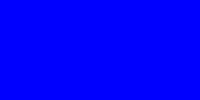

In [ ]:
color = white.copy()
color [:,:] = (255,0,0)
cv2_imshow(color)

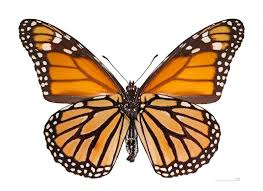

In [ ]:
img_bty=cv2.imread("butterfly.jpeg")
cv2_imshow(img_bty)

In [ ]:
img_bty.shape

(191, 263, 3)

**Pixel Manipulation and Filtering**

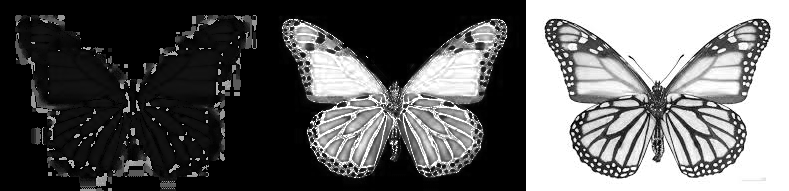

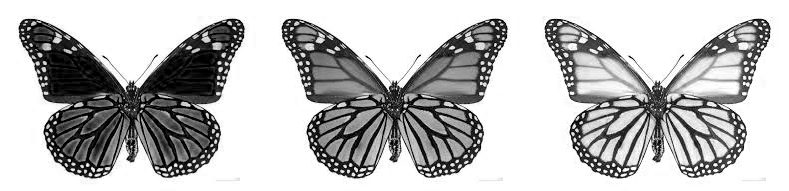

In [ ]:
img_bty=cv2.imread("butterfly.jpeg")
height, width, channel = img_bty.shape
b , g , r = cv2.split(img_bty)
rgb_split = np.empty([height, width*3,3], 'uint8')
rgb_split[:, 0:width] = cv2.merge([b,b,b])
rgb_split[:, width:width*2] = cv2.merge([g,g,g])
rgb_split[:, width*2:width*3] = cv2.merge([r,r,r])
hsv = cv2.cvtColor(img_bty, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(hsv)
hsv_split = np.concatenate((h,s,v), axis = 1)
cv2_imshow(hsv_split)

cv2_imshow(rgb_split)

# cv2.moveWindow("rgb_split", 0, height) # cv2.moveWindow is not supported by cv2_imshow

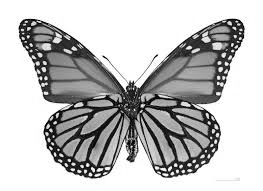

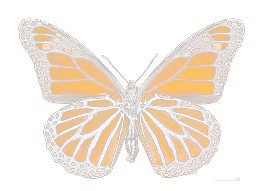

In [ ]:
gray = cv2.cvtColor(img_bty, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)
b = img_bty[:, :, 0]
g = img_bty[:, :, 1]
r = img_bty[:, :, 2]

rgba = cv2.merge((b , g , r , g))
cv2.imwrite("rgba.png",rgba)
cv2_imshow(rgba)

**Blur, Dilation, Erosion**

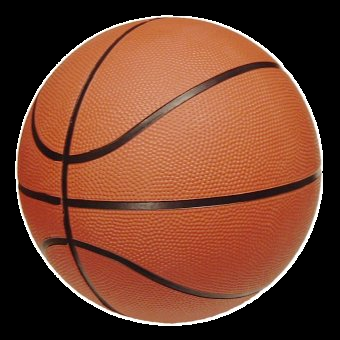

In [ ]:
b_ball = cv2.imread("b_ball.png")
cv2_imshow(b_ball)

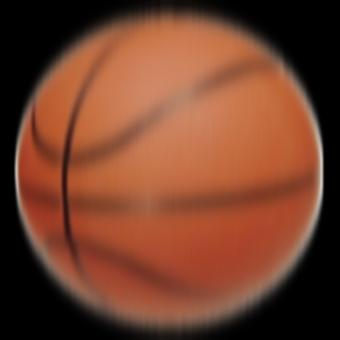

In [ ]:
blur = cv2.GaussianBlur(b_ball, (5,55),0)
cv2_imshow(blur)

In [ ]:
kernel = np.ones((5,5), 'uint8')

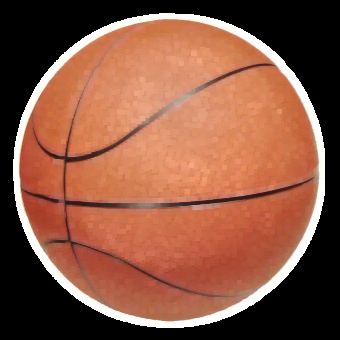

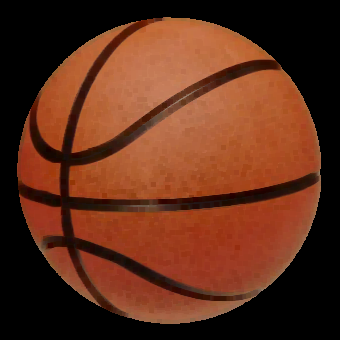

In [ ]:
dilate = cv2.dilate(b_ball, kernel, iterations = 1)
erode = cv2.erode(b_ball, kernel, iterations = 1)
cv2_imshow(dilate)
cv2_imshow(erode)

**RESIZE AND SCALLING**

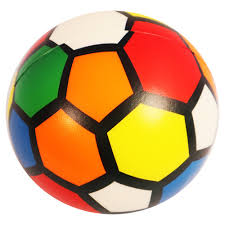

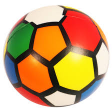

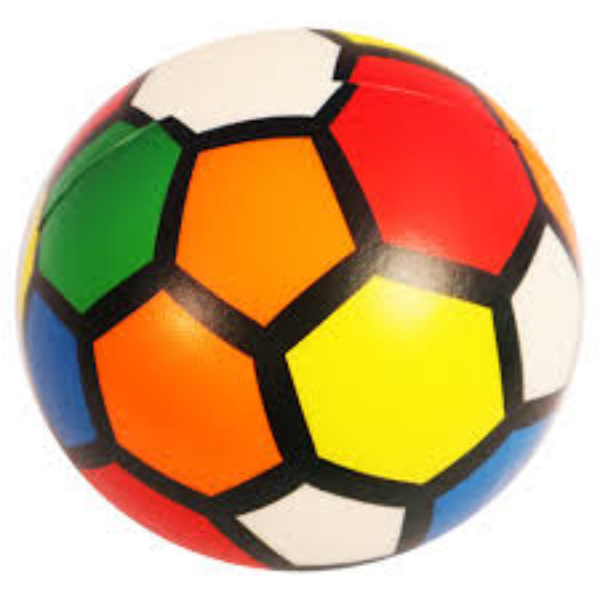

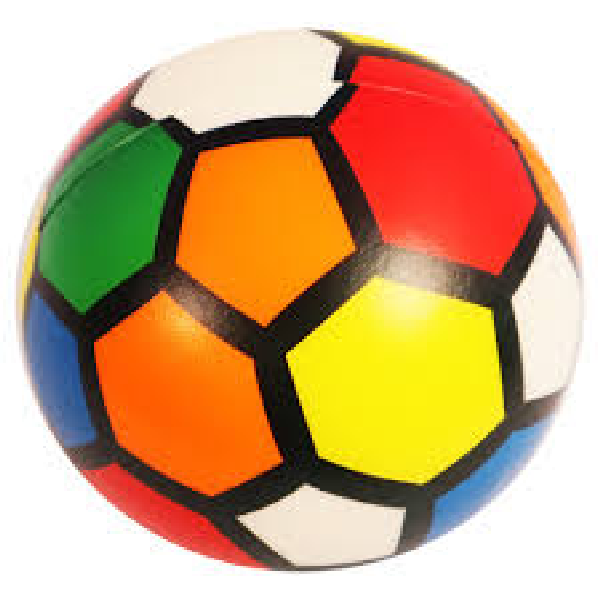

In [ ]:
bb_ball = cv2.imread("bb_ball.jpeg")
cv2_imshow(bb_ball)

img_half = cv2.resize(bb_ball, (0,0), fx = 0.5, fy = 0.5)
img_stretch = cv2.resize(bb_ball, (600, 600))
img_stretch_ner = cv2.resize(bb_ball, (600,600), interpolation = cv2.INTER_NEAREST)
cv2_imshow(img_half)
cv2_imshow(img_stretch)
cv2_imshow(img_stretch_ner)

**Rotation**

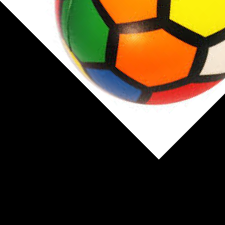

In [ ]:
M = cv2.getRotationMatrix2D((0,0), 45,1)
rotated = cv2.warpAffine(bb_ball, M, (bb_ball.shape[1], bb_ball.shape[0]))
cv2_imshow(rotated)

**Thresholding**

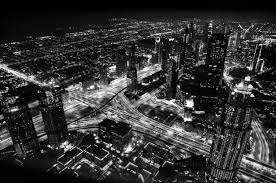

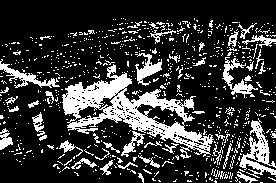

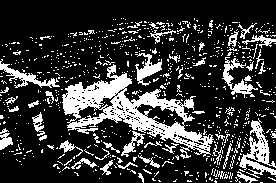

In [ ]:
city = cv2.imread("city.jpeg",0)
height, width = city.shape[0:2]
binary = np.zeros ([height, width, 1], 'uint8')
threshold = 85
for row in range (0, height):
  for col in range (0,width):
    if city[row][col] > threshold:
      binary[row][col] = 255

cv2_imshow(city)
cv2_imshow(binary)

ret, thresh = cv2.threshold(city, threshold, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh)

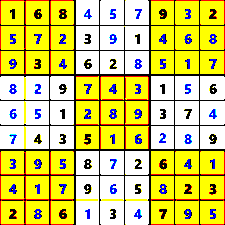

Image sep


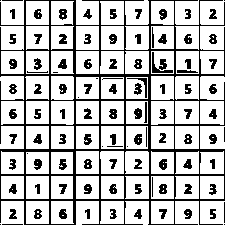

In [ ]:
soduku = cv2.imread("soduku.png")
ret, thresh_basic = cv2.threshold(soduku, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh_basic)
print ("Image sep")
soduku_gray = cv2.cvtColor(soduku, cv2.COLOR_BGR2GRAY)
thresh_adapt = cv2.adaptiveThreshold(soduku_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
cv2_imshow(thresh_adapt)

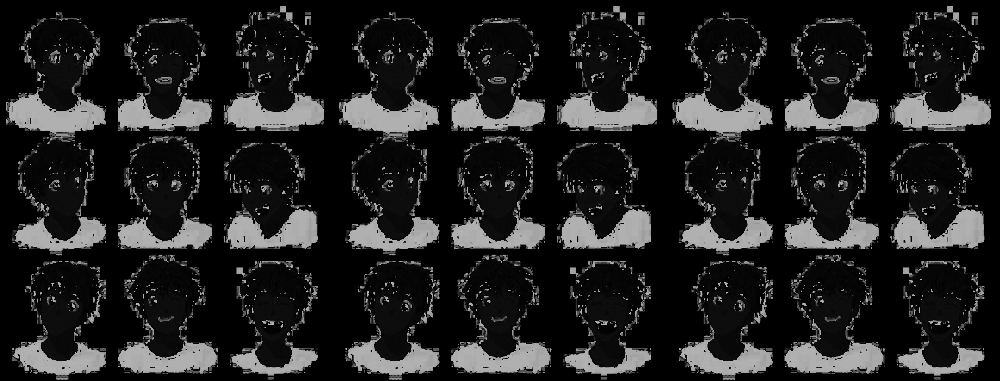

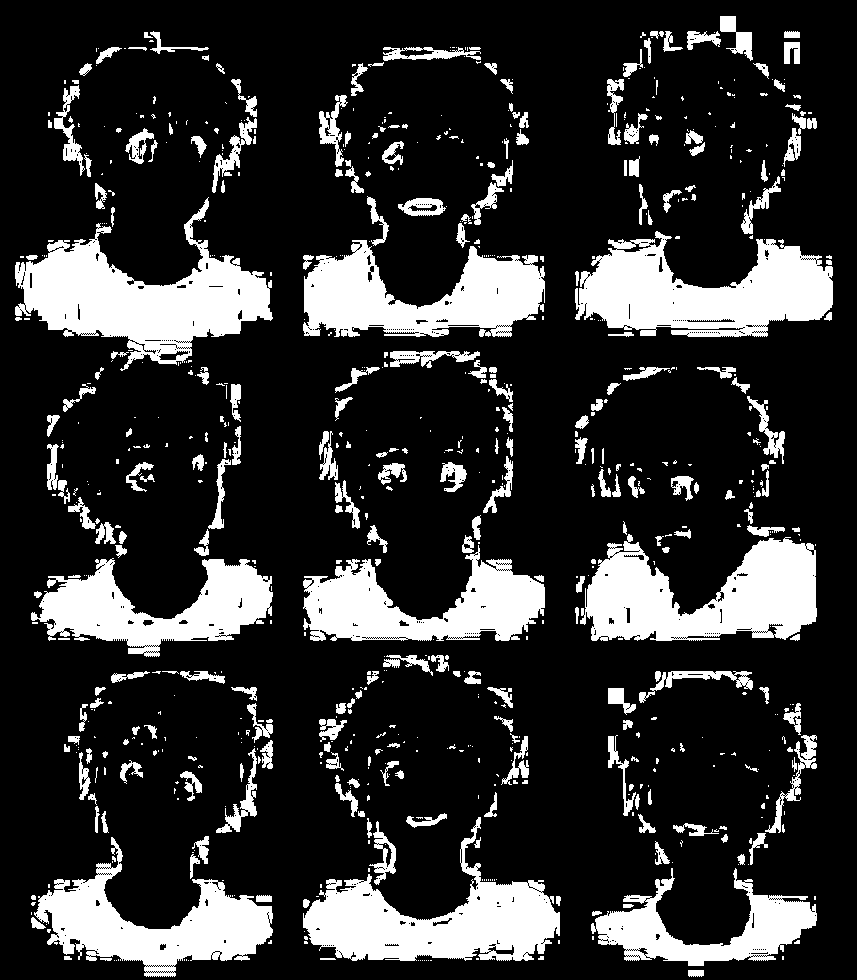

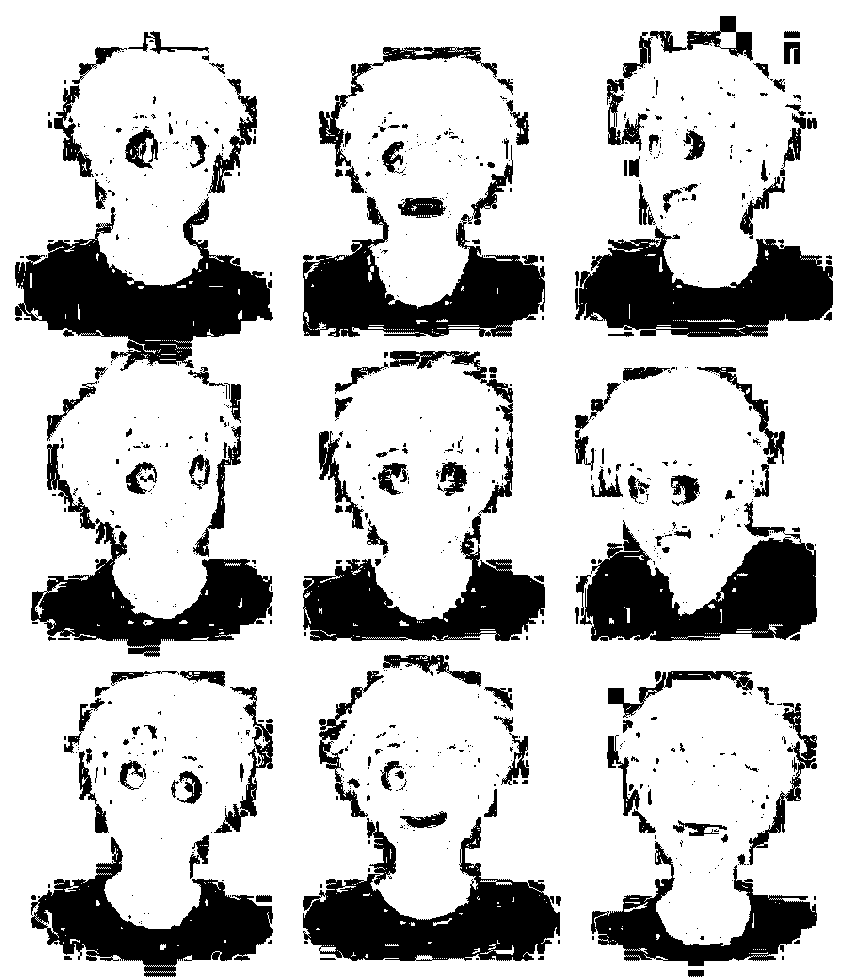

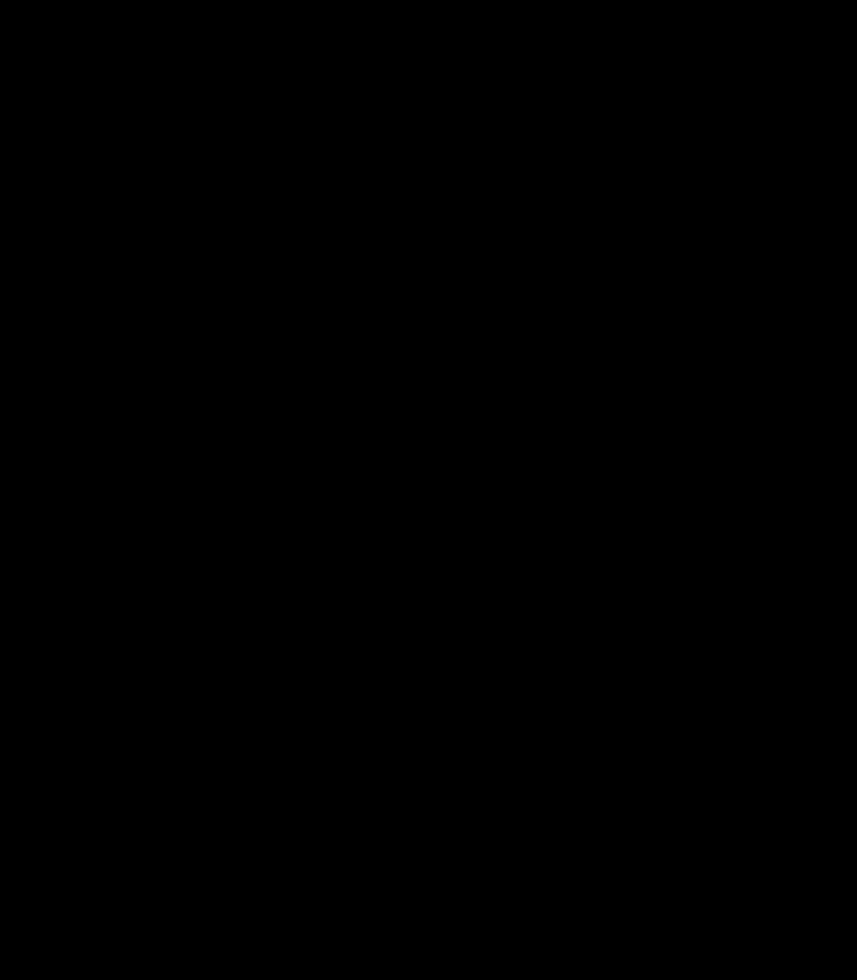

In [ ]:
faces = cv2.imread("faces.jpg")
hsv = cv2.cvtColor(faces, cv2.COLOR_BGR2HSV)
h = hsv[:, :, 0]
s = hsv[:, :, 0]
v = hsv[:, :, 0]

hsv_split = np.concatenate((h,s,v), axis = 1)
cv2_imshow(hsv_split)

ret, min_sat = cv2.threshold(s, 40, 255, cv2.THRESH_BINARY)
cv2_imshow(min_sat)

ret, max_hue = cv2.threshold(h, 15, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(max_hue)

final = cv2.bitwise_and(min_sat, max_hue)
cv2_imshow(final)

**Contours**

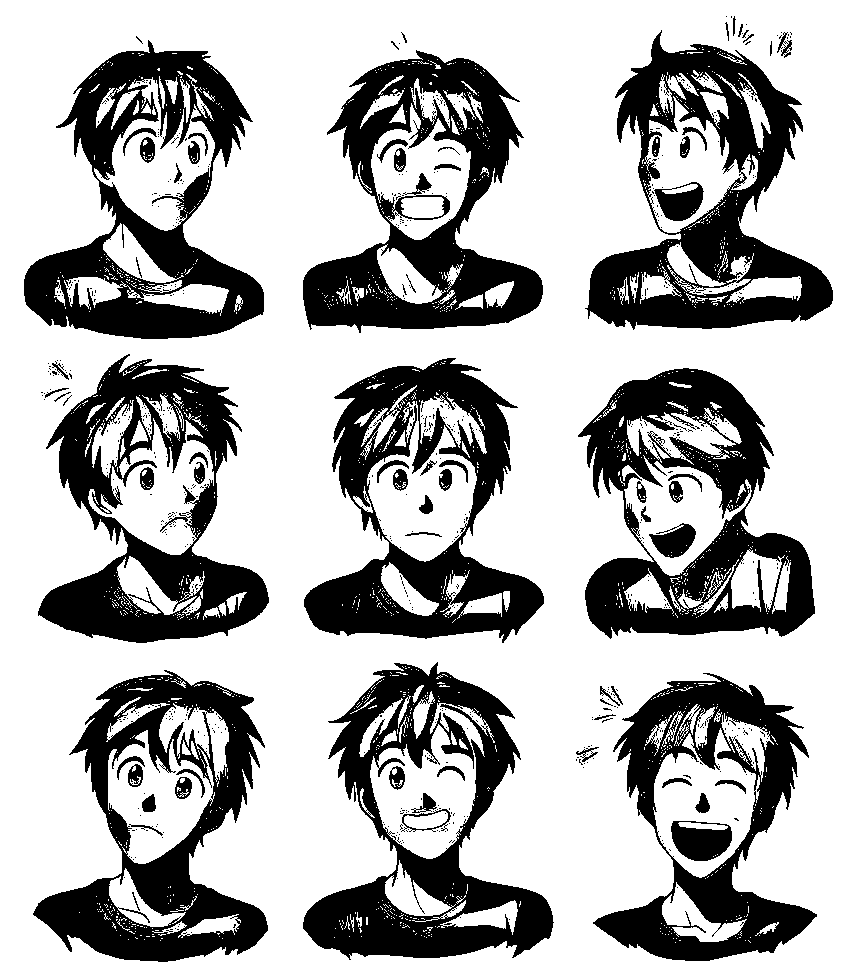

Contours


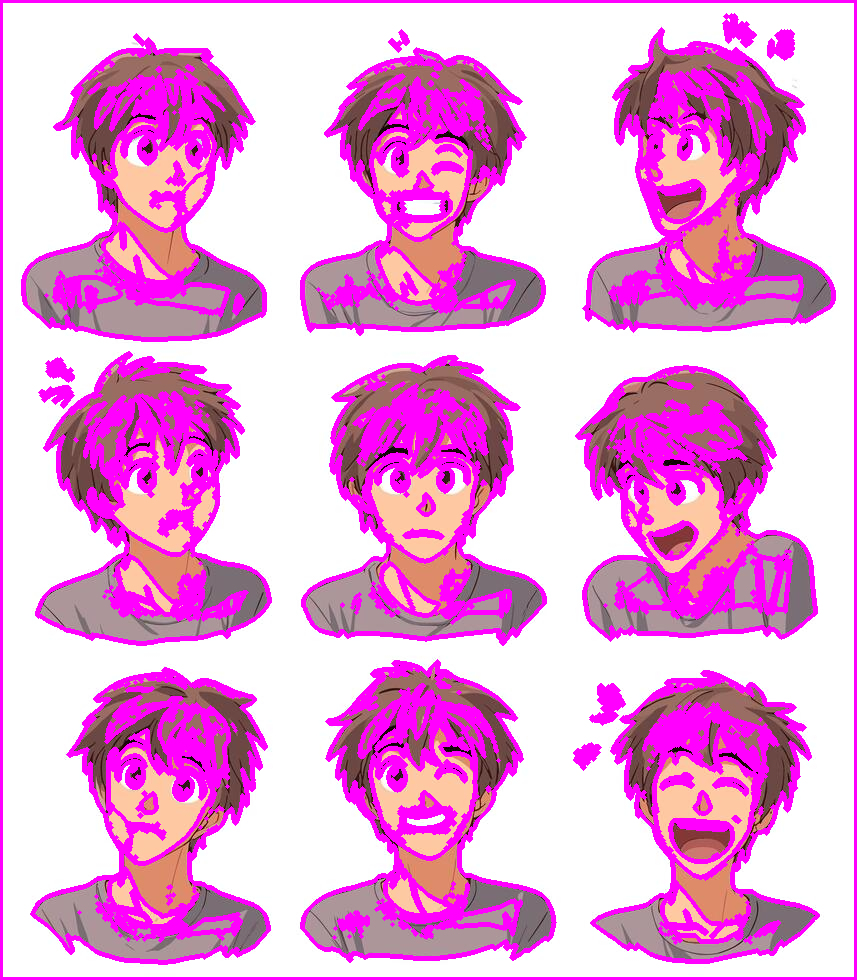

In [ ]:
face_c = cv2.imread("faces.jpg")
gray = cv2.cvtColor(face_c, cv2.COLOR_RGB2GRAY)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
cv2_imshow(thresh)

contours, hierachy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print("Contours")
imgc = face_c.copy()
index = -1
thickness = 4
color = (255, 0, 255)
cv2.drawContours(imgc, contours, index, color, thickness)
cv2_imshow(imgc)

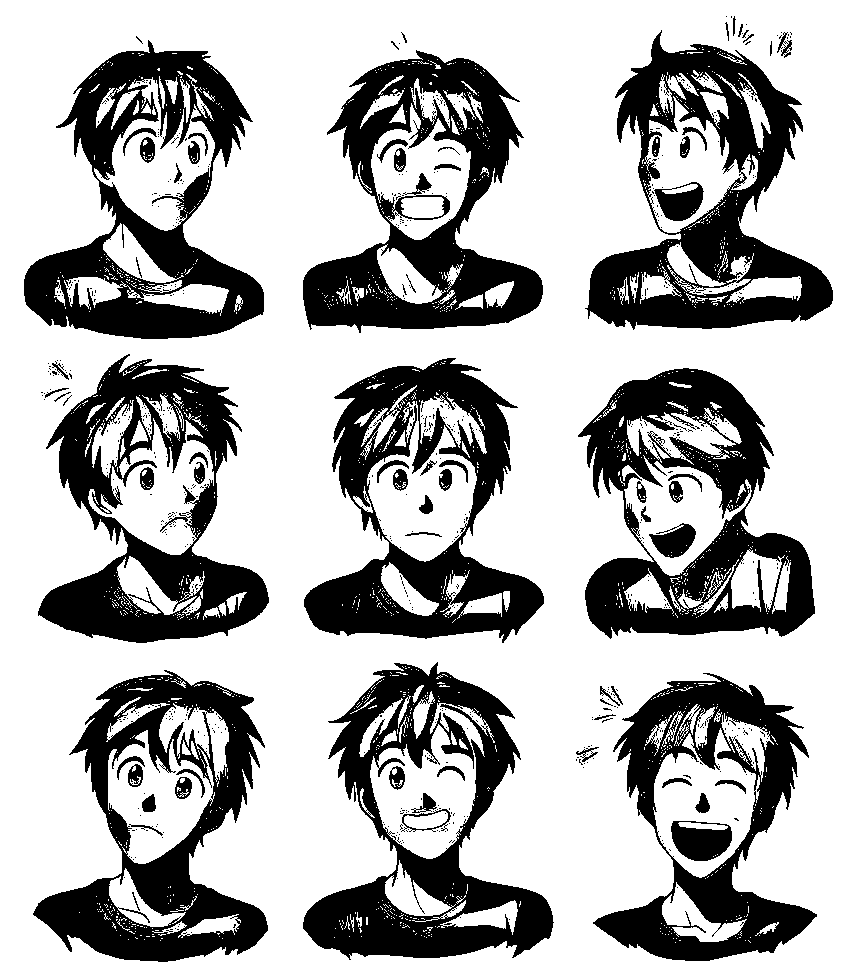

Contours
Area 838024.0, Perimeter 3670.0
Area 2.0, Perimeter 5.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 5.5, Perimeter 9.071067690849304
Area 2.0, Perimeter 5.656854152679443
Area 11.0, Perimeter 14.485281229019165
Area 4.0, Perimeter 7.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 4.0, Perimeter 7.656854152679443
Area 4.0, Perimeter 7.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 4.0, Perimeter 7.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 5.5, Perimeter 9.071067690849304
Area 2.0, Perimeter 5.656854152679443
Area 58.5, Perimeter 43.69848418235779
Area 2.0, Perimeter 5.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 4.0, Perimeter 7.656854152679443
Area 78.0, Perimeter 61.94112491607666
Area 2.0, Perimeter 5.656854152679443
Area 4.0, Perimeter 7.656854152679443
Area 2.0, Perimeter 5.656854152679443
Area 19.5, Perimeter 22.727921843528748
Are

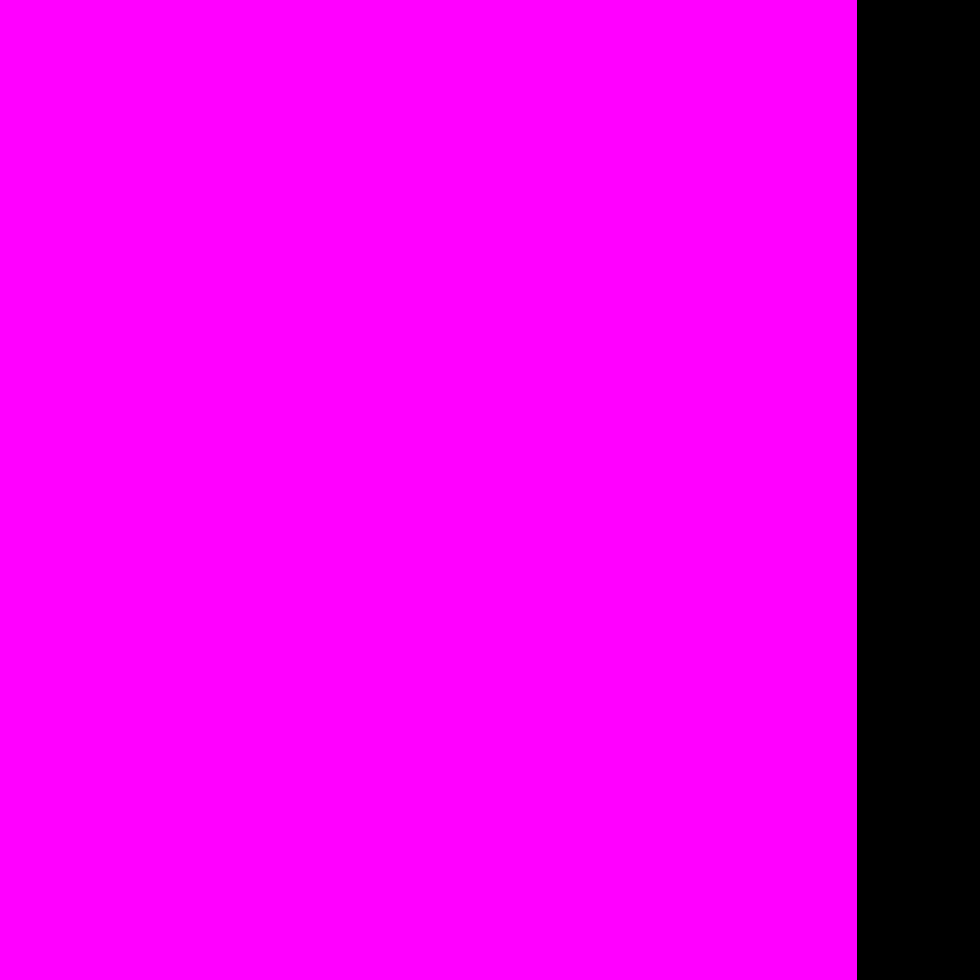

In [ ]:
face_c = cv2.imread("faces.jpg")
gray = cv2.cvtColor(face_c, cv2.COLOR_RGB2GRAY)
thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 115, 1)
cv2_imshow(thresh)

contours, hierachy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print("Contours")
imgc = face_c.copy()
index = -1
thickness = 4
color = (255, 0, 255)

objects = np.zeros([face_c.shape[0], face_c.shape[0], 3], 'uint8')

for c in contours:
  cv2.drawContours(objects, [c], -1, color, -1)
  area = cv2.contourArea(c)
  perimeter = cv2.arcLength(c, True)
  M = cv2.moments(c)
  if M['m00'] != 0:  # Add this check
    cx = int (M['m10']/M['m00'])
    cy = int(M['m01']/M['m00'])
    circle  = (objects, (cx, cy), 4, (0, 0, 255), -1)
    print(f"Area {area}, Perimeter {perimeter}")

cv2_imshow(objects)

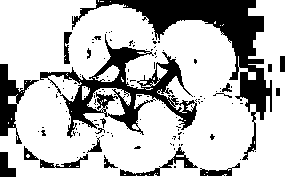

edges image


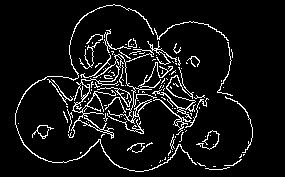

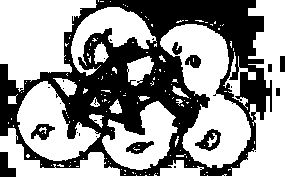

Area 2822.0
Area 3469.0
Area 451.5
Area 308.0
Area 6424.0
Area 375.0
Area 2161.5
Area 6871.0
Area 5270.0


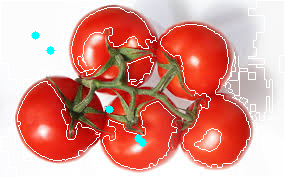

In [ ]:
tomato = cv2.imread("toma.jpeg")

hsv = cv2.cvtColor(tomato, cv2.COLOR_BGR2HSV)
res, thresh = cv2.threshold(hsv[:, :, 0], 10, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(thresh)

print("edges image")

edges = cv2.Canny(tomato, 100, 200, apertureSize=3)
cv2_imshow(edges)
print(" ")
edges_inv = 255 - edges
#erosion to increase border size
kernel = np.ones((3,3), 'uint8')
erode = cv2.erode(edges_inv, kernel, iterations=1)

canny_thresh = cv2.bitwise_and(thresh, erode)
cv2_imshow(canny_thresh)

contours, hierachy = cv2.findContours(canny_thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

tomato_c = tomato.copy()
for c in contours:
  area = cv2.contourArea(c)
  if area < 300:
    continue
  print ("Area", area)
  cv2.drawContours(tomato_c, [c], -1, (255, 255, 255), 1)
  M = cv2.moments(c)
  cx = int(M['m10']/M['m00'])
  cy = int(M['m10']/M['m00'])
  cv2.circle(tomato_c, (cx, cy), 4, (255, 255, 0), -1 )
cv2_imshow(tomato_c)


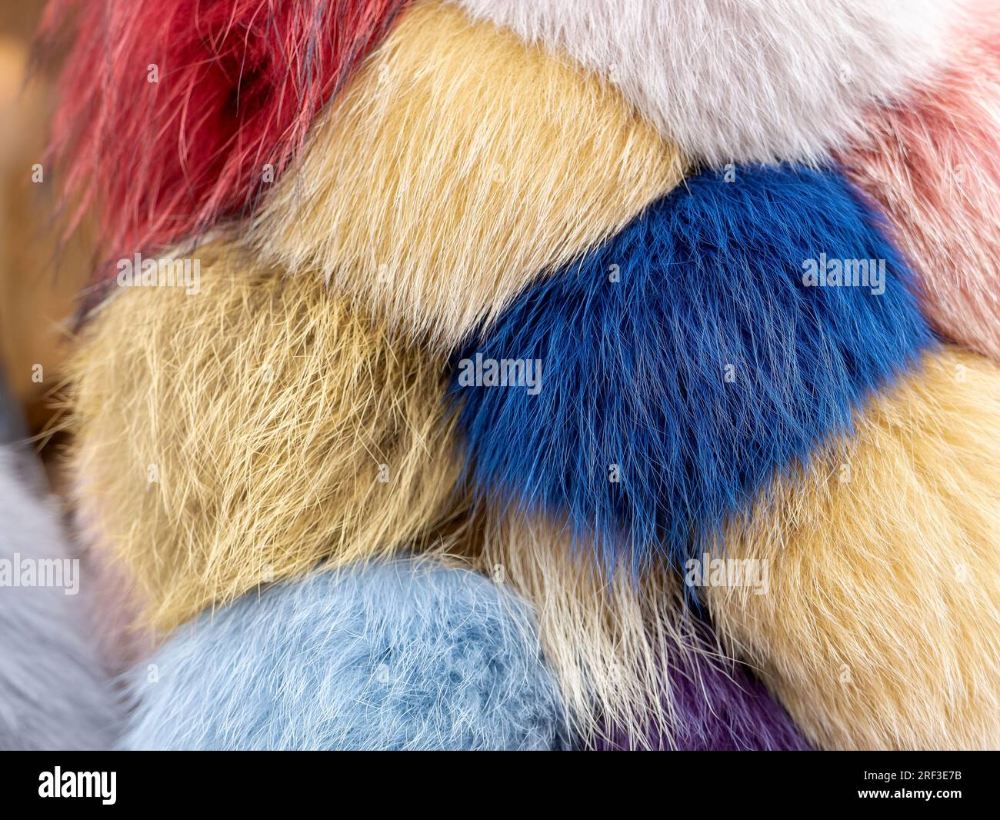

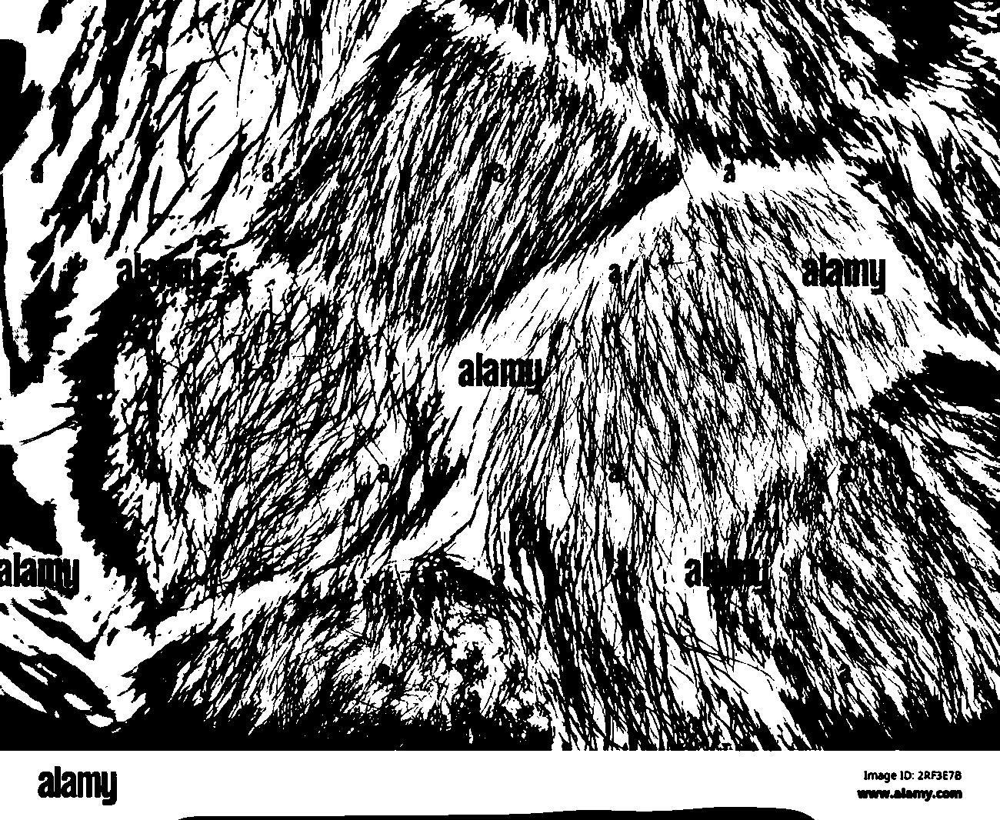

(array([[[870, 971]],

       [[870, 973]]], dtype=int32), array([[[916, 970]],

       [[916, 972]],

       [[917, 972]],

       [[916, 971]]], dtype=int32), array([[[909, 970]],

       [[909, 971]]], dtype=int32), array([[[1060,  968]],

       [[1061,  969]],

       [[1061,  971]],

       [[1062,  972]],

       [[1062,  973]],

       [[1062,  970]],

       [[1061,  969]],

       [[1061,  968]]], dtype=int32), array([[[1031,  967]],

       [[1032,  968]],

       [[1032,  971]],

       [[1034,  973]],

       [[1035,  973]],

       [[1035,  971]],

       [[1033,  969]],

       [[1033,  968]],

       [[1032,  967]]], dtype=int32), array([[[963, 967]],

       [[963, 968]],

       [[964, 969]],

       [[964, 968]]], dtype=int32), array([[[890, 967]],

       [[888, 969]],

       [[888, 970]],

       [[889, 970]],

       [[890, 969]]], dtype=int32), array([[[523, 967]],

       [[522, 968]],

       [[521, 968]],

       [[521, 969]],

       [[520, 970]]], dtype=int

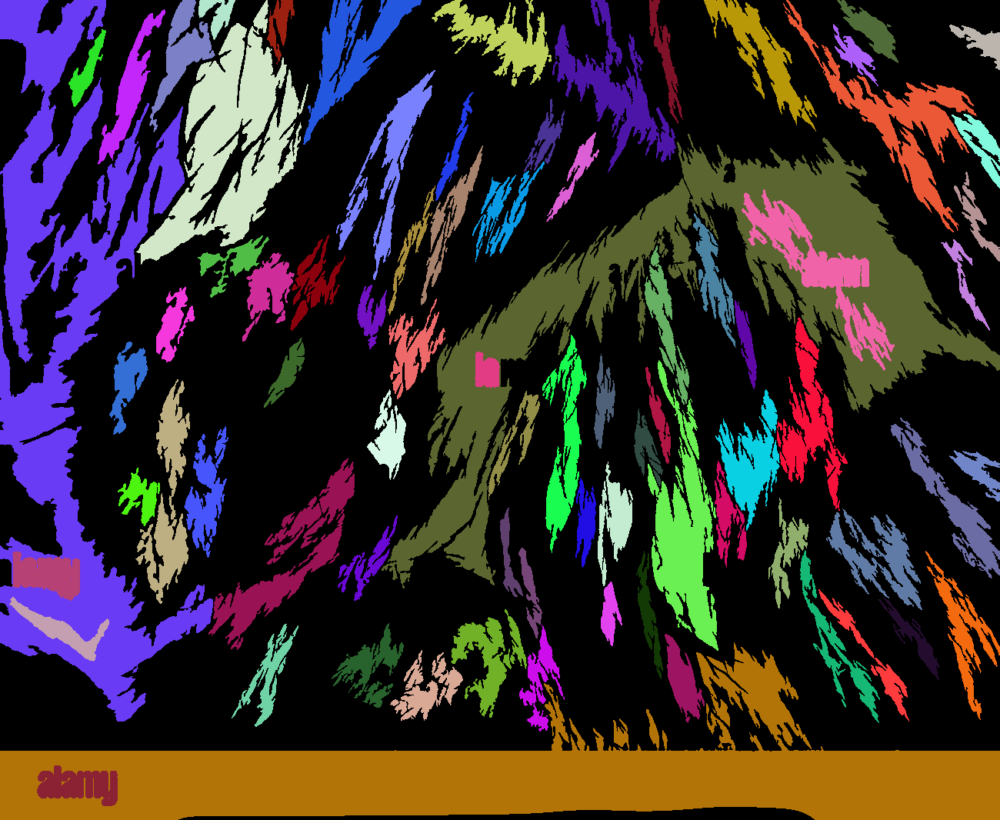

In [ ]:
fuzzy= cv2.imread("fuzzy.jpg")
cv2_imshow(fuzzy)

gray = cv2.cvtColor(fuzzy, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)

thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 205, 1)
cv2_imshow(thresh)

contours, hierachy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print(contours)

filtered = []
for c in contours:
  area = cv2.contourArea(c)
  if area < 1000:
    continue
  filtered.append(c)
print(len(filtered))

objects = np.zeros([fuzzy.shape[0], fuzzy.shape[1],3], 'uint8')
for c in filtered:
  col = ( randint(0,255), randint(0,255) ,randint(0,255) )
  cv2.drawContours(objects, [c], -1, col, -1)
  area = cv2.contourArea(c)
  print(area)

cv2_imshow(objects)

0.24218715727329254 (128, 0) 15 255 2


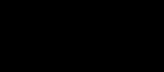

In [ ]:
ball = cv2.imread("ball.jpeg")
field_ball = cv2.imread("field_ball1.jpeg")

# Resize ball2 to be smaller than field_ball (e.g., 50% of its original size)
new_height = int(ball.shape[0] * 0.5)
new_width = int(ball.shape[1] * 0.5)
ball_resized = cv2.resize(ball, (new_width, new_height))

result = cv2.matchTemplate(field_ball , ball_resized, cv2.TM_CCOEFF_NORMED)

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
print (max_val, max_loc, 15, 255, 2)

cv2_imshow(result)

In [ ]:

!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml -O haarcascade_frontalface_default.xml

--2025-07-12 10:55:51--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.08s   

2025-07-12 10:55:52 (10.4 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]



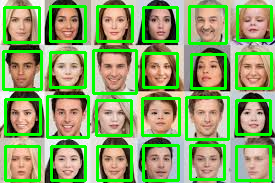

In [ ]:
faces_1 = cv2.imread("face.jpeg")


gray = cv2.cvtColor(faces_1, cv2.COLOR_BGR2GRAY)

path = "haarcascade_frontalface_default.xml"
face_cascade = cv2.CascadeClassifier(path)
faces = face_cascade.detectMultiScale(gray, scaleFactor = 1.01, minNeighbors=2, minSize=(25,30))
#print(len(faces))

for (x, y, w, h) in faces:
  cv2.rectangle(faces_1, (x,y), (x+w, y+h), (0, 255, 0), 2)
cv2_imshow(faces_1)


In [1]:
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye.xml -O haarcascade_eye.xml

--2025-07-12 12:41:57--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_eye.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 341406 (333K) [text/plain]
Saving to: ‘haarcascade_eye.xml’

haarcascade_eye.xml 100%[===================>] 333.40K  --.-KB/s    in 0.03s   

2025-07-12 12:41:57 (13.0 MB/s) - ‘haarcascade_eye.xml’ saved [341406/341406]



In [ ]:
f_eye = cv2.imread("face.jpeg")
gray = cv2.cvtColor(f_eye, cv2.COLOR_BGR2GRAY)
path = "haarcascade_eye.xml"
eye_cascade = cv2.CascadeClassifier(path)
eyes = eye_cascade.detectMultiScale(gray, scaleFactor=1.00001, minNeighbors=10, minSize = (1,5))
print (len(eyes))

for (x, y, w, h) in eyes:
  xc = (x+ x+w)/2
  yc = (y + y+w)/2
  radius = w/2
  cv2.circle(f_eye, (int(xc), int(yc)), int (radius), (255, 0 , 0), 2)
cv2_imshow(f_eye)